In [1]:
import pandas as pd
import altair as alt
import matplotlib.pyplot as plt

data = pd.read_csv('college_admissions.csv')

data.columns


Index(['super_opeid', 'name', 'par_income_bin', 'par_income_lab', 'attend',
       'stderr_attend', 'attend_level', 'attend_sat', 'stderr_attend_sat',
       'attend_level_sat', 'rel_apply', 'stderr_rel_apply', 'rel_attend',
       'stderr_rel_attend', 'rel_att_cond_app', 'rel_apply_sat',
       'stderr_rel_apply_sat', 'rel_attend_sat', 'stderr_rel_attend_sat',
       'rel_att_cond_app_sat', 'attend_instate', 'stderr_attend_instate',
       'attend_level_instate', 'attend_instate_sat',
       'stderr_attend_instate_sat', 'attend_level_instate_sat',
       'attend_oostate', 'stderr_attend_oostate', 'attend_level_oostate',
       'attend_oostate_sat', 'stderr_attend_oostate_sat',
       'attend_level_oostate_sat', 'rel_apply_instate',
       'stderr_rel_apply_instate', 'rel_attend_instate',
       'stderr_rel_attend_instate', 'rel_att_cond_app_instate',
       'rel_apply_oostate', 'stderr_rel_apply_oostate', 'rel_attend_oostate',
       'stderr_rel_attend_oostate', 'rel_att_cond_app_oost

In [2]:
options = ['Highly selective private', 'Highly selective public', 'Ivy Plus', 'Other elite schools (public and private)', 
           'Selective private', 'Selective public', None]
labels = ['Highly selective private', 'Highly selective public', 'Ivy Plus', 'Other elite schools (public and private)', 
           'Selective private', 'Selective public', 'All']

input_radio = alt.binding_radio(options = options, labels = labels, name = 'School Tier: ')

selection = alt.selection_point(fields = ['tier'], bind = input_radio)

alt.Chart(data).mark_point().encode(
    alt.Y('rel_apply:Q', title = 'Application Rate', scale=alt.Scale(domain=[data['rel_apply'].min(), data['rel_apply'].max()])),
    alt.X('par_income_bin:N', title = 'Income Bracket'),
    alt.Color('tier'),
    alt.Tooltip(['tier', 'par_income_bin'])
).properties(title = 'Application Rate and Income Bin', width = 500, height = 500).add_params(
    selection).transform_filter(selection)



/opt/anaconda3/lib/python3.12/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/anaconda3/lib/python3.12/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/anaconda3/lib/python3.12/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/anaconda3/lib/python3.12/site-packages/altair/utils/c

alt.Chart(...)

In [3]:
import seaborn as sns
data = data.dropna()
# sns.barplot(x='par_income_bin', y='attend_instate', data=data, label='In-state Attendance')
# sns.barplot(x='par_income_bin', y='attend_oostate', data=data, label='Out-of-state Attendance')
# plt.show()

instate = alt.Chart(data).mark_bar(color = 'magenta').encode(
    alt.X('par_income_bin:N', title = 'Income Bracket (percentage)'),
    alt.Y('attend_instate:Q', title = 'Attendance Rate')
).properties(title = 'Income Bracket and In State Attendance')

oostate = alt.Chart(data).mark_bar(color = '#39FF14').encode(
    alt.X('par_income_bin:N', title = 'Income Bracket (percentage)'),
    alt.Y('attend_oostate:Q', title = 'Attendance Rate')
).properties(title = 'Income Bracket and Out of State Attendance')

instate | oostate

/opt/anaconda3/lib/python3.12/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/anaconda3/lib/python3.12/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/anaconda3/lib/python3.12/site-packages/altair/utils/core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/opt/anaconda3/lib/python3.12/site-packages/altair/utils/c

alt.HConcatChart(...)

In [4]:
# compare median household income with selectivity of colleges in that state 

states = {'American University': 'District of Columbia', 'Amherst College': 'Massachusetts', 'Auburn University': 'Alabama', 
          'Barnard College': 'New York', 'Bates College': 'Maine', 'Baylor University': 'Texas', 'Binghamton University': 'New York', 
          'Boston College': 'Massachusetts', 'Boston University': 'Massachusetts', 'Bowdoin College': 'Maine', 'Brandeis University': 'Massachusetts',
          'Brigham Young University': 'Utah', 'Brown University': 'Rhode Island', 'Bryn Mawr College': 'Pennsylvania', 'Bucknell University': 'Pennsylvania',
          'California Institute of Technology': 'California', 'Carleton College': 'Minnesota', 'Carnegie Mellon University': 'Pennsylvania',
          'Case Western Reserve University': 'Ohio', 'Claremont McKenna College': 'California', 'Clark University': 'Massachusetts', 
          'Clemson University': 'South Carolina', 'Colby College': 'Maine', 'Colgate University': 'New York',
          'College of the Holy Cross': 'Massachusetts', 'College of William and Mary': 'Virginia', 'Colorado School of Mines': 'Colorado',
          'Columbia University In The City Of New York': 'New York', 'Connecticut College': 'Connecticut', 'Cornell University': 'New York',
          'Dartmouth College': 'New Hampshire','Davidson College': 'North Carolina','Duke University': 'North Carolina',
          'Elon University': 'North Carolina','Emory University': 'Georgia','Florida State University': 'Florida','Fordham University': 'New York',
          'Franklin & Marshall College': 'Pennsylvania','George Washington University': 'District of Columbia', 'Georgetown University': 'District of Columbia',
          'Georgia Institute Of Technology': 'Georgia','Gonzaga University': 'Washington','Hamilton College': 'New York','Harvard University': 'Massachusetts',
          'Haverford College': 'Pennsylvania','Howard University': 'District of Columbia','Johns Hopkins University': 'Maryland',
          'Kenyon College': 'Ohio','Lafayette College': 'Pennsylvania','Lehigh University': 'Pennsylvania','Loyola Marymount University': 'California',
          'Macalester College': 'Minnesota','Marquette University': 'Wisconsin','Massachusetts Institute Of Technology': 'Massachusetts',
          'Michigan State University': 'Michigan','Middlebury College': 'Vermont', 'New York University': 'New York',
          'North Carolina State University': 'North Carolina','Northeastern University': 'Massachusetts','Northwestern University': 'Illinois',
          'Oberlin College': 'Ohio','Occidental College': 'California','Ohio State University': 'Ohio','Pepperdine University': 'California',
          'Pomona College': 'California','Princeton University': 'New Jersey','Purdue University': 'Indiana','Reed College': 'Oregon',
          'Rensselaer Polytechnic Institute': 'New York','Rice University': 'Texas','Rutgers, The State University Of New Jersey': 'New Jersey',
          'Santa Clara University': 'California','Scripps College': 'California','Southern Methodist University': 'Texas',
          'Stanford University': 'California','State University Of New York At Buffalo': 'New York',
          'State University Of New York At Stony Brook': 'New York','Swarthmore College': 'Pennsylvania','Syracuse University': 'New York',
          'Texas A&M University': 'Texas','Texas Christian University': 'Texas','Trinity College of Hartford, CT': 'Connecticut',
          'Tufts University': 'Massachusetts','University Of Alabama': 'Alabama','University Of Arkansas': 'Arkansas',
          'University Of California, Berkeley': 'California','University Of California, Davis': 'California',
          'University Of California, Irvine': 'California','University Of California, Los Angeles': 'California',
          'University Of California, Riverside': 'California','University Of California, San Diego': 'California',
          'University Of California, Santa Barbara': 'California','University Of California, Santa Cruz': 'California',
          'University Of Chicago': 'Illinois','University Of Connecticut': 'Connecticut','University Of Delaware': 'Delaware',
          'University Of Florida': 'Florida','University Of Georgia': 'Georgia','University Of Idaho': 'Idaho','University Of Iowa': 'Iowa',
          'University Of Kansas': 'Kansas','University Of Kentucky': 'Kentucky','University Of Miami': 'Florida',
          'University Of Michigan - Ann Arbor': 'Michigan','University Of Mississippi': 'Mississippi','University Of Montana': 'Montana',
          'University Of Nevada, Reno': 'Nevada','University Of New Hampshire': 'New Hampshire','University Of New Mexico': 'New Mexico',
          'University Of North Carolina - Chapel Hill': 'North Carolina','University Of North Dakota': 'North Dakota',
          'University Of Notre Dame': 'Indiana','University Of Oklahoma': 'Oklahoma','University Of Oregon': 'Oregon',
          'University Of Pennsylvania': 'Pennsylvania','University Of Pittsburgh System': 'Pennsylvania','University Of Rhode Island': 'Rhode Island',
          'University Of Richmond': 'Virginia','University Of Rochester': 'New York','University Of South Florida': 'Florida',
          'University Of Southern California': 'California','University Of Texas At Austin': 'Texas','University Of Utah': 'Utah',
          'University Of Virginia': 'Virginia','University Of Wyoming': 'Wyoming','Vanderbilt University': 'Tennessee','Vassar College': 'New York',
          'Villanova University': 'Pennsylvania','Virginia Polytechnic Institute & State University': 'Virginia',
          'Wake Forest University': 'North Carolina','Washington And Lee University': 'Virginia','Washington University In St. Louis': 'Missouri',
          'Wellesley College': 'Massachusetts','Wesleyan University': 'Connecticut','Whitman College': 'Washington', 'Williams College': 'Massachusetts',
          'Worcester Polytechnic Institute': 'Massachusetts','Yale University': 'Connecticut','Yeshiva University': 'New York'}

data['state'] = data['name'].map(states)

state_abbreviations = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 'California': 'CA',
    'Colorado': 'CO', 'Connecticut': 'CT', 'Delaware': 'DE', 'Florida': 'FL', 'Georgia': 'GA',
    'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA',
    'Kansas': 'KS', 'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD',
    'Massachusetts': 'MA', 'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS',
    'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH',
    'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC',
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA',
    'Rhode Island': 'RI', 'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN',
    'Texas': 'TX', 'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA', 'Washington': 'WA',
    'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY', 'District of Columbia': 'DC'
}

data['code'] = data['state'].map(state_abbreviations)

/var/folders/tx/kdl5k7d95s7c12s_d5zkw98c0000gn/T/ipykernel_31540/2699966113.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['state'] = data['name'].map(states)
/var/folders/tx/kdl5k7d95s7c12s_d5zkw98c0000gn/T/ipykernel_31540/2699966113.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['code'] = data['state'].map(state_abbreviations)


In [5]:
import plotly.express as px
import numpy as np

# get average income bin by state
avg_inc = data.groupby('code')['par_income_bin'].mean().reset_index()
avg_inc.columns = ['code', 'avg_inc_state']

data = pd.merge(data, avg_inc, on='code', how='left')


In [6]:
value_counts = data.groupby('code')['tier'].value_counts()

most_pop_tier = value_counts.groupby(level=0).idxmax().to_frame(name='most_pop_tier').reset_index()

most_pop_tier.columns = ['code', 'most_pop_tier']

data = pd.merge(data, most_pop_tier, on='code', how='left')

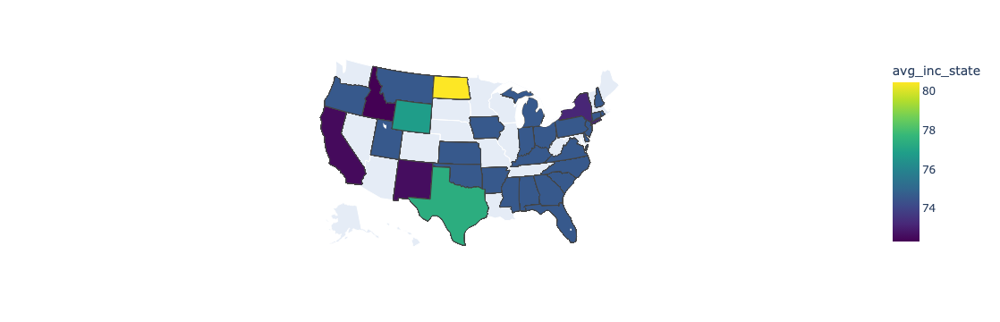

In [7]:
px.choropleth(
    data, 
    locations = "code",
    locationmode = 'USA-states',
    scope = 'usa',
    color = 'avg_inc_state', 
    hover_name = 'code', 
    hover_data = ['name', 'most_pop_tier'],
    color_continuous_scale= 'Viridis'
)

In [16]:
income = pd.read_csv('MedianHouseholdIncome2015.csv', encoding = 'latin1')
income['Geographic Area'].unique()

array(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA',
       'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA',
       'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
       'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
       'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'], dtype=object)